### Урок 6. Сегментация

In [2]:
import tensorflow as tf
import tensorflow_datasets as tfds
from matplotlib import pyplot as plt
import numpy as np

In [1]:
# Некий датасет с сегментационной разметкой с TensorFlow - Называется Lost and Found

In [5]:
dataset = tfds.load('LostAndFound', with_info=True)

Shuffling and writing examples to C:\/Users/Asus/tensorflow_datasets/lost_and_found/semantic_segmentation/1.0.0.incompleteG0EBOI/lost_and_found-train.tfrecord


Shuffling and writing examples to C:\/Users/Asus/tensorflow_datasets/lost_and_found/semantic_segmentation/1.0.0.incompleteG0EBOI/lost_and_found-test.tfrecord


Dataset lost_and_found downloaded and prepared to C:\Users\Asus\tensorflow_datasets\lost_and_found\semantic_segmentation\1.0.0. Subsequent calls will reuse this data.


In [6]:
# Загрузилось кое-как вроде.. 

In [23]:
tf.executing_eagerly()

True

In [26]:
sample = dataset[0]['test'].take(0)

In [32]:
sample

<TakeDataset shapes: {image_id: (), image_left: (1024, 2048, 3), segmentation_label: (1024, 2048, 1)}, types: {image_id: tf.string, image_left: tf.uint8, segmentation_label: tf.uint8}>

In [88]:
ds_list = list(dataset[0]['test'])

In [89]:
def show_element(index):
    plt.figure(figsize=(64, 128))
    plt.subplot(1, 2, 1)
    plt.imshow(tf.keras.preprocessing.image.array_to_img(ds_list[index]['image_left']))
    plt.subplot(1, 2, 2)
    plt.imshow(tf.keras.preprocessing.image.array_to_img(ds_list[index]['segmentation_label']))
    plt.show()

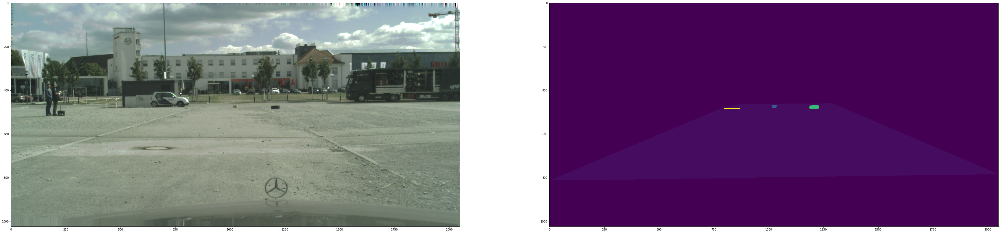

In [92]:
show_element(10)

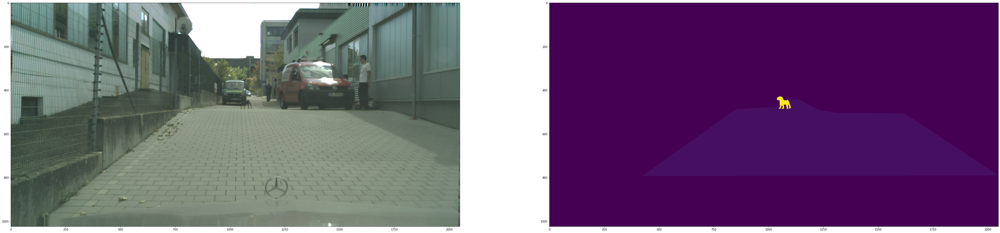

In [93]:
show_element(0)

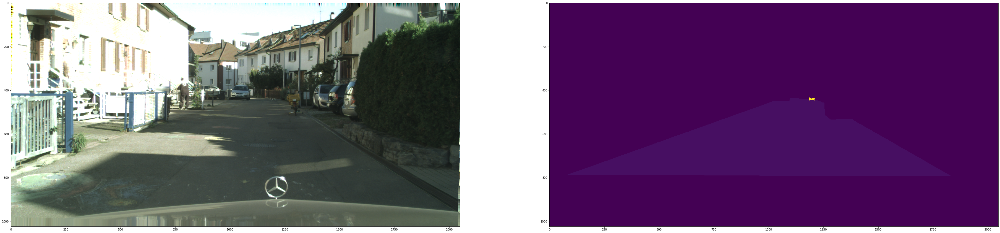

In [94]:
show_element(1000)

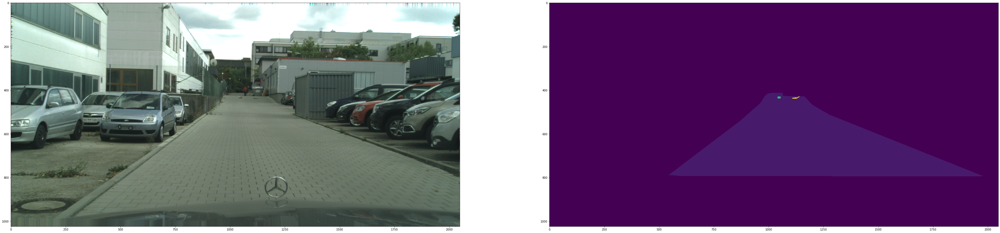

In [95]:
show_element(50)

In [98]:
# Так, мне кажется такой датасет нам не очень подходит... там есть все что нужно - но размеченные классы очень уж мелкие
# Это выпавшие на дорогу при транспортировке грузовиками предметы

In [3]:
# Тогда возвращаемся к более подходящему примеру. На вебинаре он упоминался. CityScapes - скачал с Kaggle

In [3]:
import os
base_dir = 'F:/Dropbox/cityscapes_data/'
train_dir = base_dir + 'train/'
test_dir = base_dir + 'val/'
train_list = list(map(lambda x: train_dir + x, os.listdir(train_dir)))
test_list = list(map(lambda x: test_dir + x, os.listdir(test_dir)))
train_list[:10]

['F:/Dropbox/cityscapes_data/train/1.jpg',
 'F:/Dropbox/cityscapes_data/train/10.jpg',
 'F:/Dropbox/cityscapes_data/train/100.jpg',
 'F:/Dropbox/cityscapes_data/train/1000.jpg',
 'F:/Dropbox/cityscapes_data/train/1001.jpg',
 'F:/Dropbox/cityscapes_data/train/1002.jpg',
 'F:/Dropbox/cityscapes_data/train/1003.jpg',
 'F:/Dropbox/cityscapes_data/train/1004.jpg',
 'F:/Dropbox/cityscapes_data/train/1005.jpg',
 'F:/Dropbox/cityscapes_data/train/1006.jpg']

In [17]:
len(train_list)

2975

In [4]:
import PIL.Image as Image

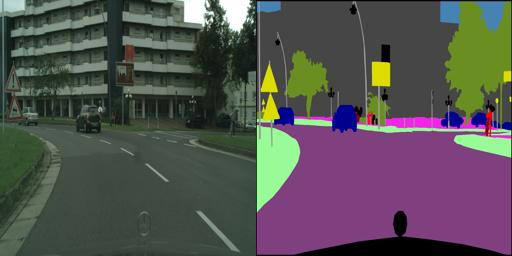

In [46]:
Image.open(train_list[0])

In [25]:
# Вобщем их надо распилить на собственно картинки, и сегментацию превратить из цвета в лейблы

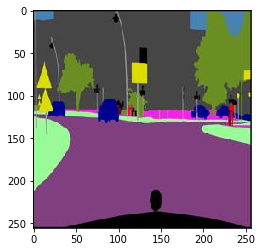

In [217]:
i = Image.open(train_list[0])
i = i.convert('RGB')
ic = i.crop((256, 0, 512, 256))
plt.imshow(np.array(ic))
ica = np.array(ic)

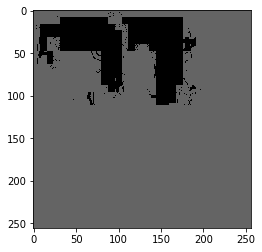

In [320]:
res = np.full(ica.shape, 100)
pos = np.where((ica[:, :, 0] == 70) & (ica[:, :, 1] == 70) & (ica[:, :, 2] == 70))
res[pos[0], pos[1]] = 0
plt.imshow(res)

In [332]:
# Какой треш получается! ))) Черное - это маска на здание как-бы...
# Картинки довольно сильно сжаты (jpg) - точность цвета в сегментации оставляет желать лучшего
# соответственно, нам придется перекодировать их опираясь не на чистые значения цветов - а на некое "расстояние" до 
# сегментного цвета

In [333]:
%%time
res = np.full(ica.shape, 100)
pos = np.where((np.abs(ica[:, :, 0] - 70) < 50) & (np.abs(ica[:, :, 1] - 70) < 50) & (np.abs(ica[:, :, 2] - 70) < 50))
res[pos[0], pos[1]] = 0

Wall time: 1 ms


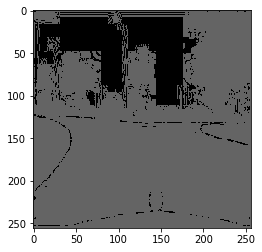

In [334]:
# Работает быстро - но результат не тот (почему-то в true условие не попадают цвета находящиеся на расстоянии 50 от заданного)
plt.imshow(res)

In [219]:
%%time
def color_distance(color1, color2):
    vector = color2 - color1
    return np.sqrt(vector.dot(vector))

# Если это расписать руками - то все ок - но работает в 500 раз медленнее

res = np.full(ica.shape, 100)
for x in range(ica.shape[0]):
    for y in range(ica.shape[1]):
        if color_distance(ica[x, y], (70, 70, 70)) < 30:
            res[x, y] = 0

Wall time: 572 ms


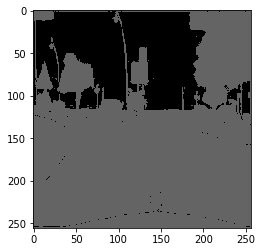

In [325]:
plt.imshow(res)

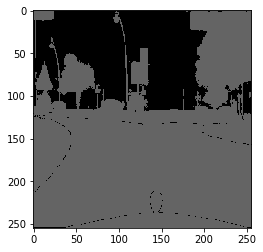

In [283]:
# Непонятно работает np.where - если подготовить заранее массив и делать простое сравнение - то ок
res = np.full(ica.shape, 100)

def diff(x, y):
    return np.abs(x - y)
v_diff = np.vectorize(diff)
tmp = v_diff(ica, 70)

pos = np.where((tmp[:, :, 0] < 30) & (tmp[:, :, 1] < 30) & (tmp[:, :, 2] < 30))
res[pos[0], pos[1]] = 0

plt.imshow(res)

Wall time: 240 ms


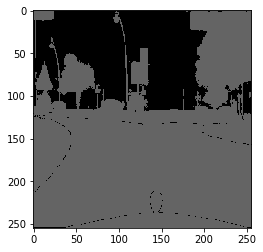

In [285]:
%%time
res = np.full(ica.shape, 100)
tmp = v_diff(ica, 70)

pos = np.where((tmp[:, :, 0] < 30) & (tmp[:, :, 1] < 30) & (tmp[:, :, 2] < 30))
res[pos[0], pos[1]] = 0

plt.imshow(res)

In [289]:
# Тоже не супер быстро.. всего в два раза быстрее поэлементного, так что...

In [440]:
def encode_segments(array_image):
    key_colors = ((70, 70, 70), (106, 142, 34), (128, 63, 127), (154, 250, 152), (248, 29, 230), (0, 0, 150), (0, 0, 0), (220, 220, 0), (70, 130, 185), (154, 154, 154), (120, 9, 30), (248, 172, 37), (232, 26, 65), (102, 102, 156), (251, 168, 164), (112, 74, 7), (191, 154, 148))
    res = np.full(array_image.shape, 0)
    for x in range(array_image.shape[0]):
        for y in range(array_image.shape[1]):
            for label, color in enumerate(key_colors):
                if color_distance(array_image[x, y], color) < 35:
                    res[x, y] = label+1
    return res

def process_image(image):
    left_image = image.crop((0, 0, 256, 256))
    right_image = image.crop((256, 0, 512, 256))
    right_image = encode_segments(np.array(right_image))
    return left_image, right_image

In [441]:
%%time
left, right = process_image(i)

Wall time: 9.18 s


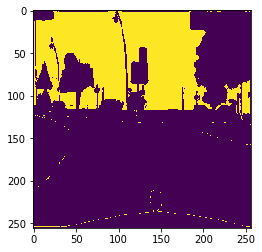

In [446]:
plt.imshow(right[...,0] == 1)

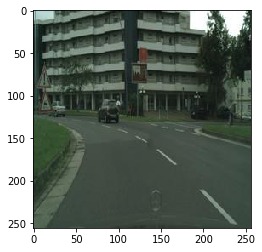

In [308]:
plt.imshow(left)

In [309]:
np.array(left).shape

(256, 256, 3)

In [310]:
right.shape

(256, 256, 3)

In [312]:
# Так - 10 секунд на картинку - это 8 часов процессинга только тестовой выборки... Жесть

In [410]:
# Поищем в другом направлении
res = np.full(ica.shape, 100)
red, green, blue = ica.T
house = (np.abs(red - 70) < 30) & (np.abs(green - 70) < 30) & (np.abs(blue - 70) < 30)
res[...][house.T] = (0, 0, 0)

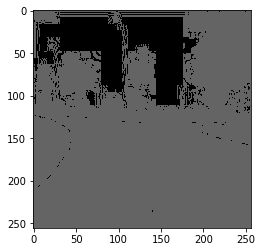

In [411]:
plt.imshow(res)

In [412]:
# Что-то я упускаю. numpy упорно не хочет производить никаких вычислений в таких выражениях... ((

In [413]:
# Ну - у Pillow тоже есть свои относительно быстрые методы..

In [414]:
%%time
res = []
for color in ic.getdata():
    if color_distance(np.array(color), (70, 70, 70)) < 30:
        res.append((0, 0, 0))
    else:
        res.append((100, 100, 100))
res_image = Image.new(ic.mode, ic.size)
res_image.putdata(res)

Wall time: 764 ms


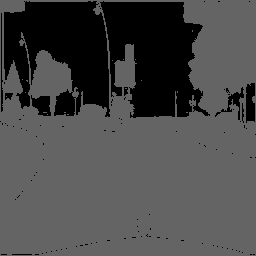

In [415]:
res_image

In [216]:
def encode_segments(image):
    key_colors = ((70, 70, 70), (106, 142, 34), (128, 63, 127), (154, 250, 152), (248, 29, 230), (0, 0, 150), (0, 0, 0), (220, 220, 0), (70, 130, 185), (154, 154, 154), (120, 9, 30), (248, 172, 37), (232, 26, 65), (102, 102, 156), (251, 168, 164), (112, 74, 7), (191, 154, 148))
    res = []
    for color in image.getdata():
        found_label = 0
        for label, key_color in enumerate(key_colors):
            if color_distance(np.array(color), key_color) < 35:
                found_label = label+1
                break;
        res.append((found_label, found_label, found_label))

    res_image = Image.new(image.mode, image.size)
    res_image.putdata(res)
    return np.array(res_image)[..., 0]

def process_image(image):
    left_image = image.crop((0, 0, 256, 256))
    right_image = image.crop((256, 0, 512, 256))
    right_image = encode_segments(right_image)
    return left_image, right_image

In [220]:
%%time
left, right = process_image(i)

Wall time: 2.63 s


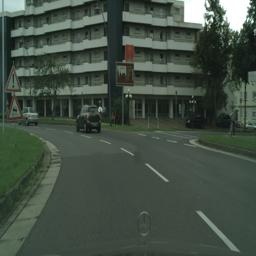

In [476]:
left

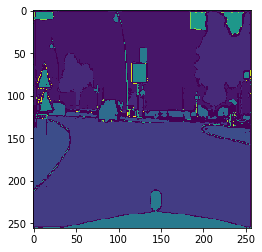

In [221]:
plt.imshow(right)

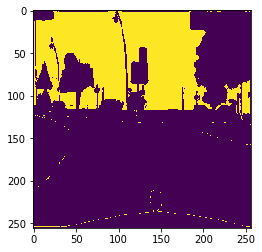

In [226]:
plt.imshow(right==1)

In [439]:
# Вобщем как мог... так сказать. Это будет "всего" часа два с половиной... на трейн...

In [656]:
for i, image_path in enumerate(train_list):
    image = Image.open(image_path)
    left, right = process_image(image)
    left.save(train_dir + 'images/' + os.path.basename(image_path), "JPEG")
    Image.fromarray(right).convert('RGB').save(train_dir + 'segmentation/' + os.path.splitext(os.path.basename(image_path))[0] + '.png', "PNG")
    print('{}... Image {} processed'.format(image_path, i))

F:/Dropbox/cityscapes_data/train/1.jpg... Image 0 processed
F:/Dropbox/cityscapes_data/train/10.jpg... Image 1 processed
F:/Dropbox/cityscapes_data/train/100.jpg... Image 2 processed
F:/Dropbox/cityscapes_data/train/1000.jpg... Image 3 processed
F:/Dropbox/cityscapes_data/train/1001.jpg... Image 4 processed
F:/Dropbox/cityscapes_data/train/1002.jpg... Image 5 processed
F:/Dropbox/cityscapes_data/train/1003.jpg... Image 6 processed
F:/Dropbox/cityscapes_data/train/1004.jpg... Image 7 processed
F:/Dropbox/cityscapes_data/train/1005.jpg... Image 8 processed
F:/Dropbox/cityscapes_data/train/1006.jpg... Image 9 processed
F:/Dropbox/cityscapes_data/train/1007.jpg... Image 10 processed
F:/Dropbox/cityscapes_data/train/1008.jpg... Image 11 processed
F:/Dropbox/cityscapes_data/train/1009.jpg... Image 12 processed
F:/Dropbox/cityscapes_data/train/101.jpg... Image 13 processed
F:/Dropbox/cityscapes_data/train/1010.jpg... Image 14 processed
F:/Dropbox/cityscapes_data/train/1011.jpg... Image 15 pro

F:/Dropbox/cityscapes_data/train/1227.jpg... Image 254 processed
F:/Dropbox/cityscapes_data/train/1228.jpg... Image 255 processed
F:/Dropbox/cityscapes_data/train/1229.jpg... Image 256 processed
F:/Dropbox/cityscapes_data/train/123.jpg... Image 257 processed
F:/Dropbox/cityscapes_data/train/1230.jpg... Image 258 processed
F:/Dropbox/cityscapes_data/train/1231.jpg... Image 259 processed
F:/Dropbox/cityscapes_data/train/1232.jpg... Image 260 processed
F:/Dropbox/cityscapes_data/train/1233.jpg... Image 261 processed
F:/Dropbox/cityscapes_data/train/1234.jpg... Image 262 processed
F:/Dropbox/cityscapes_data/train/1235.jpg... Image 263 processed
F:/Dropbox/cityscapes_data/train/1236.jpg... Image 264 processed
F:/Dropbox/cityscapes_data/train/1237.jpg... Image 265 processed
F:/Dropbox/cityscapes_data/train/1238.jpg... Image 266 processed
F:/Dropbox/cityscapes_data/train/1239.jpg... Image 267 processed
F:/Dropbox/cityscapes_data/train/124.jpg... Image 268 processed
F:/Dropbox/cityscapes_data/

F:/Dropbox/cityscapes_data/train/1454.jpg... Image 506 processed
F:/Dropbox/cityscapes_data/train/1455.jpg... Image 507 processed
F:/Dropbox/cityscapes_data/train/1456.jpg... Image 508 processed
F:/Dropbox/cityscapes_data/train/1457.jpg... Image 509 processed
F:/Dropbox/cityscapes_data/train/1458.jpg... Image 510 processed
F:/Dropbox/cityscapes_data/train/1459.jpg... Image 511 processed
F:/Dropbox/cityscapes_data/train/146.jpg... Image 512 processed
F:/Dropbox/cityscapes_data/train/1460.jpg... Image 513 processed
F:/Dropbox/cityscapes_data/train/1461.jpg... Image 514 processed
F:/Dropbox/cityscapes_data/train/1462.jpg... Image 515 processed
F:/Dropbox/cityscapes_data/train/1463.jpg... Image 516 processed
F:/Dropbox/cityscapes_data/train/1464.jpg... Image 517 processed
F:/Dropbox/cityscapes_data/train/1465.jpg... Image 518 processed
F:/Dropbox/cityscapes_data/train/1466.jpg... Image 519 processed
F:/Dropbox/cityscapes_data/train/1467.jpg... Image 520 processed
F:/Dropbox/cityscapes_data

F:/Dropbox/cityscapes_data/train/1681.jpg... Image 758 processed
F:/Dropbox/cityscapes_data/train/1682.jpg... Image 759 processed
F:/Dropbox/cityscapes_data/train/1683.jpg... Image 760 processed
F:/Dropbox/cityscapes_data/train/1684.jpg... Image 761 processed
F:/Dropbox/cityscapes_data/train/1685.jpg... Image 762 processed
F:/Dropbox/cityscapes_data/train/1686.jpg... Image 763 processed
F:/Dropbox/cityscapes_data/train/1687.jpg... Image 764 processed
F:/Dropbox/cityscapes_data/train/1688.jpg... Image 765 processed
F:/Dropbox/cityscapes_data/train/1689.jpg... Image 766 processed
F:/Dropbox/cityscapes_data/train/169.jpg... Image 767 processed
F:/Dropbox/cityscapes_data/train/1690.jpg... Image 768 processed
F:/Dropbox/cityscapes_data/train/1691.jpg... Image 769 processed
F:/Dropbox/cityscapes_data/train/1692.jpg... Image 770 processed
F:/Dropbox/cityscapes_data/train/1693.jpg... Image 771 processed
F:/Dropbox/cityscapes_data/train/1694.jpg... Image 772 processed
F:/Dropbox/cityscapes_data

F:/Dropbox/cityscapes_data/train/1908.jpg... Image 1010 processed
F:/Dropbox/cityscapes_data/train/1909.jpg... Image 1011 processed
F:/Dropbox/cityscapes_data/train/191.jpg... Image 1012 processed
F:/Dropbox/cityscapes_data/train/1910.jpg... Image 1013 processed
F:/Dropbox/cityscapes_data/train/1911.jpg... Image 1014 processed
F:/Dropbox/cityscapes_data/train/1912.jpg... Image 1015 processed
F:/Dropbox/cityscapes_data/train/1913.jpg... Image 1016 processed
F:/Dropbox/cityscapes_data/train/1914.jpg... Image 1017 processed
F:/Dropbox/cityscapes_data/train/1915.jpg... Image 1018 processed
F:/Dropbox/cityscapes_data/train/1916.jpg... Image 1019 processed
F:/Dropbox/cityscapes_data/train/1917.jpg... Image 1020 processed
F:/Dropbox/cityscapes_data/train/1918.jpg... Image 1021 processed
F:/Dropbox/cityscapes_data/train/1919.jpg... Image 1022 processed
F:/Dropbox/cityscapes_data/train/192.jpg... Image 1023 processed
F:/Dropbox/cityscapes_data/train/1920.jpg... Image 1024 processed
F:/Dropbox/c

F:/Dropbox/cityscapes_data/train/2130.jpg... Image 1258 processed
F:/Dropbox/cityscapes_data/train/2131.jpg... Image 1259 processed
F:/Dropbox/cityscapes_data/train/2132.jpg... Image 1260 processed
F:/Dropbox/cityscapes_data/train/2133.jpg... Image 1261 processed
F:/Dropbox/cityscapes_data/train/2134.jpg... Image 1262 processed
F:/Dropbox/cityscapes_data/train/2135.jpg... Image 1263 processed
F:/Dropbox/cityscapes_data/train/2136.jpg... Image 1264 processed
F:/Dropbox/cityscapes_data/train/2137.jpg... Image 1265 processed
F:/Dropbox/cityscapes_data/train/2138.jpg... Image 1266 processed
F:/Dropbox/cityscapes_data/train/2139.jpg... Image 1267 processed
F:/Dropbox/cityscapes_data/train/214.jpg... Image 1268 processed
F:/Dropbox/cityscapes_data/train/2140.jpg... Image 1269 processed
F:/Dropbox/cityscapes_data/train/2141.jpg... Image 1270 processed
F:/Dropbox/cityscapes_data/train/2142.jpg... Image 1271 processed
F:/Dropbox/cityscapes_data/train/2143.jpg... Image 1272 processed
F:/Dropbox/

F:/Dropbox/cityscapes_data/train/2354.jpg... Image 1506 processed
F:/Dropbox/cityscapes_data/train/2355.jpg... Image 1507 processed
F:/Dropbox/cityscapes_data/train/2356.jpg... Image 1508 processed
F:/Dropbox/cityscapes_data/train/2357.jpg... Image 1509 processed
F:/Dropbox/cityscapes_data/train/2358.jpg... Image 1510 processed
F:/Dropbox/cityscapes_data/train/2359.jpg... Image 1511 processed
F:/Dropbox/cityscapes_data/train/236.jpg... Image 1512 processed
F:/Dropbox/cityscapes_data/train/2360.jpg... Image 1513 processed
F:/Dropbox/cityscapes_data/train/2361.jpg... Image 1514 processed
F:/Dropbox/cityscapes_data/train/2362.jpg... Image 1515 processed
F:/Dropbox/cityscapes_data/train/2363.jpg... Image 1516 processed
F:/Dropbox/cityscapes_data/train/2364.jpg... Image 1517 processed
F:/Dropbox/cityscapes_data/train/2365.jpg... Image 1518 processed
F:/Dropbox/cityscapes_data/train/2366.jpg... Image 1519 processed
F:/Dropbox/cityscapes_data/train/2367.jpg... Image 1520 processed
F:/Dropbox/

F:/Dropbox/cityscapes_data/train/2578.jpg... Image 1754 processed
F:/Dropbox/cityscapes_data/train/2579.jpg... Image 1755 processed
F:/Dropbox/cityscapes_data/train/258.jpg... Image 1756 processed
F:/Dropbox/cityscapes_data/train/2580.jpg... Image 1757 processed
F:/Dropbox/cityscapes_data/train/2581.jpg... Image 1758 processed
F:/Dropbox/cityscapes_data/train/2582.jpg... Image 1759 processed
F:/Dropbox/cityscapes_data/train/2583.jpg... Image 1760 processed
F:/Dropbox/cityscapes_data/train/2584.jpg... Image 1761 processed
F:/Dropbox/cityscapes_data/train/2585.jpg... Image 1762 processed
F:/Dropbox/cityscapes_data/train/2586.jpg... Image 1763 processed
F:/Dropbox/cityscapes_data/train/2587.jpg... Image 1764 processed
F:/Dropbox/cityscapes_data/train/2588.jpg... Image 1765 processed
F:/Dropbox/cityscapes_data/train/2589.jpg... Image 1766 processed
F:/Dropbox/cityscapes_data/train/259.jpg... Image 1767 processed
F:/Dropbox/cityscapes_data/train/2590.jpg... Image 1768 processed
F:/Dropbox/c

F:/Dropbox/cityscapes_data/train/2800.jpg... Image 2002 processed
F:/Dropbox/cityscapes_data/train/2801.jpg... Image 2003 processed
F:/Dropbox/cityscapes_data/train/2802.jpg... Image 2004 processed
F:/Dropbox/cityscapes_data/train/2803.jpg... Image 2005 processed
F:/Dropbox/cityscapes_data/train/2804.jpg... Image 2006 processed
F:/Dropbox/cityscapes_data/train/2805.jpg... Image 2007 processed
F:/Dropbox/cityscapes_data/train/2806.jpg... Image 2008 processed
F:/Dropbox/cityscapes_data/train/2807.jpg... Image 2009 processed
F:/Dropbox/cityscapes_data/train/2808.jpg... Image 2010 processed
F:/Dropbox/cityscapes_data/train/2809.jpg... Image 2011 processed
F:/Dropbox/cityscapes_data/train/281.jpg... Image 2012 processed
F:/Dropbox/cityscapes_data/train/2810.jpg... Image 2013 processed
F:/Dropbox/cityscapes_data/train/2811.jpg... Image 2014 processed
F:/Dropbox/cityscapes_data/train/2812.jpg... Image 2015 processed
F:/Dropbox/cityscapes_data/train/2813.jpg... Image 2016 processed
F:/Dropbox/

F:/Dropbox/cityscapes_data/train/347.jpg... Image 2251 processed
F:/Dropbox/cityscapes_data/train/348.jpg... Image 2252 processed
F:/Dropbox/cityscapes_data/train/349.jpg... Image 2253 processed
F:/Dropbox/cityscapes_data/train/35.jpg... Image 2254 processed
F:/Dropbox/cityscapes_data/train/350.jpg... Image 2255 processed
F:/Dropbox/cityscapes_data/train/351.jpg... Image 2256 processed
F:/Dropbox/cityscapes_data/train/352.jpg... Image 2257 processed
F:/Dropbox/cityscapes_data/train/353.jpg... Image 2258 processed
F:/Dropbox/cityscapes_data/train/354.jpg... Image 2259 processed
F:/Dropbox/cityscapes_data/train/355.jpg... Image 2260 processed
F:/Dropbox/cityscapes_data/train/356.jpg... Image 2261 processed
F:/Dropbox/cityscapes_data/train/357.jpg... Image 2262 processed
F:/Dropbox/cityscapes_data/train/358.jpg... Image 2263 processed
F:/Dropbox/cityscapes_data/train/359.jpg... Image 2264 processed
F:/Dropbox/cityscapes_data/train/36.jpg... Image 2265 processed
F:/Dropbox/cityscapes_data/

F:/Dropbox/cityscapes_data/train/574.jpg... Image 2503 processed
F:/Dropbox/cityscapes_data/train/575.jpg... Image 2504 processed
F:/Dropbox/cityscapes_data/train/576.jpg... Image 2505 processed
F:/Dropbox/cityscapes_data/train/577.jpg... Image 2506 processed
F:/Dropbox/cityscapes_data/train/578.jpg... Image 2507 processed
F:/Dropbox/cityscapes_data/train/579.jpg... Image 2508 processed
F:/Dropbox/cityscapes_data/train/58.jpg... Image 2509 processed
F:/Dropbox/cityscapes_data/train/580.jpg... Image 2510 processed
F:/Dropbox/cityscapes_data/train/581.jpg... Image 2511 processed
F:/Dropbox/cityscapes_data/train/582.jpg... Image 2512 processed
F:/Dropbox/cityscapes_data/train/583.jpg... Image 2513 processed
F:/Dropbox/cityscapes_data/train/584.jpg... Image 2514 processed
F:/Dropbox/cityscapes_data/train/585.jpg... Image 2515 processed
F:/Dropbox/cityscapes_data/train/586.jpg... Image 2516 processed
F:/Dropbox/cityscapes_data/train/587.jpg... Image 2517 processed
F:/Dropbox/cityscapes_data

F:/Dropbox/cityscapes_data/train/800.jpg... Image 2755 processed
F:/Dropbox/cityscapes_data/train/801.jpg... Image 2756 processed
F:/Dropbox/cityscapes_data/train/802.jpg... Image 2757 processed
F:/Dropbox/cityscapes_data/train/803.jpg... Image 2758 processed
F:/Dropbox/cityscapes_data/train/804.jpg... Image 2759 processed
F:/Dropbox/cityscapes_data/train/805.jpg... Image 2760 processed
F:/Dropbox/cityscapes_data/train/806.jpg... Image 2761 processed
F:/Dropbox/cityscapes_data/train/807.jpg... Image 2762 processed
F:/Dropbox/cityscapes_data/train/808.jpg... Image 2763 processed
F:/Dropbox/cityscapes_data/train/809.jpg... Image 2764 processed
F:/Dropbox/cityscapes_data/train/81.jpg... Image 2765 processed
F:/Dropbox/cityscapes_data/train/810.jpg... Image 2766 processed
F:/Dropbox/cityscapes_data/train/811.jpg... Image 2767 processed
F:/Dropbox/cityscapes_data/train/812.jpg... Image 2768 processed
F:/Dropbox/cityscapes_data/train/813.jpg... Image 2769 processed
F:/Dropbox/cityscapes_data

PermissionError: [Errno 13] Permission denied: 'F:/Dropbox/cityscapes_data/train/images'

In [466]:
len(test_list)

502

In [657]:
for i, image_path in enumerate(test_list):
    image = Image.open(image_path)
    left, right = process_image(image)
    left.save(test_dir + 'images/' + os.path.basename(image_path), "JPEG")
    Image.fromarray(right).convert('RGB').save(test_dir + 'segmentation/' + os.path.splitext(os.path.basename(image_path))[0] + '.png', "PNG")
    print('{}... Image {} processed'.format(image_path, i))

F:/Dropbox/cityscapes_data/val/1.jpg... Image 0 processed
F:/Dropbox/cityscapes_data/val/10.jpg... Image 1 processed
F:/Dropbox/cityscapes_data/val/100.jpg... Image 2 processed
F:/Dropbox/cityscapes_data/val/101.jpg... Image 3 processed
F:/Dropbox/cityscapes_data/val/102.jpg... Image 4 processed
F:/Dropbox/cityscapes_data/val/103.jpg... Image 5 processed
F:/Dropbox/cityscapes_data/val/104.jpg... Image 6 processed
F:/Dropbox/cityscapes_data/val/105.jpg... Image 7 processed
F:/Dropbox/cityscapes_data/val/106.jpg... Image 8 processed
F:/Dropbox/cityscapes_data/val/107.jpg... Image 9 processed
F:/Dropbox/cityscapes_data/val/108.jpg... Image 10 processed
F:/Dropbox/cityscapes_data/val/109.jpg... Image 11 processed
F:/Dropbox/cityscapes_data/val/11.jpg... Image 12 processed
F:/Dropbox/cityscapes_data/val/110.jpg... Image 13 processed
F:/Dropbox/cityscapes_data/val/111.jpg... Image 14 processed
F:/Dropbox/cityscapes_data/val/112.jpg... Image 15 processed
F:/Dropbox/cityscapes_data/val/113.jpg

F:/Dropbox/cityscapes_data/val/339.jpg... Image 266 processed
F:/Dropbox/cityscapes_data/val/34.jpg... Image 267 processed
F:/Dropbox/cityscapes_data/val/340.jpg... Image 268 processed
F:/Dropbox/cityscapes_data/val/341.jpg... Image 269 processed
F:/Dropbox/cityscapes_data/val/342.jpg... Image 270 processed
F:/Dropbox/cityscapes_data/val/343.jpg... Image 271 processed
F:/Dropbox/cityscapes_data/val/344.jpg... Image 272 processed
F:/Dropbox/cityscapes_data/val/345.jpg... Image 273 processed
F:/Dropbox/cityscapes_data/val/346.jpg... Image 274 processed
F:/Dropbox/cityscapes_data/val/347.jpg... Image 275 processed
F:/Dropbox/cityscapes_data/val/348.jpg... Image 276 processed
F:/Dropbox/cityscapes_data/val/349.jpg... Image 277 processed
F:/Dropbox/cityscapes_data/val/35.jpg... Image 278 processed
F:/Dropbox/cityscapes_data/val/350.jpg... Image 279 processed
F:/Dropbox/cityscapes_data/val/351.jpg... Image 280 processed
F:/Dropbox/cityscapes_data/val/352.jpg... Image 281 processed
F:/Dropbox

PermissionError: [Errno 13] Permission denied: 'F:/Dropbox/cityscapes_data/val/images'

In [5]:
# Загрузка примеров
train_image_dir = base_dir + 'train/images/'
test_image_dir = base_dir + 'val/images/'
train_seg_dir = base_dir + 'train/segmentation/'
test_seg_dir = base_dir + 'val/segmentation/'
train_image_list = list(map(lambda x: train_image_dir + x, os.listdir(train_image_dir)))
train_seg_list = list(map(lambda x: train_seg_dir + x, os.listdir(train_seg_dir)))
test_image_list = list(map(lambda x: test_image_dir + x, os.listdir(test_image_dir)))
test_seg_list = list(map(lambda x: test_seg_dir + x, os.listdir(test_seg_dir)))
train_image_list[:3]

['F:/Dropbox/cityscapes_data/train/images/1.jpg',
 'F:/Dropbox/cityscapes_data/train/images/10.jpg',
 'F:/Dropbox/cityscapes_data/train/images/100.jpg']

In [20]:
# Картинок много, все не войдут в память одновременно. Нужен генератор...

def to_norm_array(image):
    return np.array(image).astype(np.float32)/256.0

def to_ohe(image):
    """Преобразует индексированные цвета (0, 1, 2, 3...) в One Hot Encoding (18 каналов)"""
    arr = np.array(image)
    one_chan = arr[...,0]
    one_dim = one_chan.reshape(one_chan.size)
    ohe = np.zeros((one_dim.size, 18))
    rows = np.arange(one_dim.size)
    ohe[rows, one_dim] = 1
    return ohe.reshape((arr.shape[0], arr.shape[1], ohe.shape[1]))

def generate_data(directory, batch_size):
    i = 0
    image_dir = directory + 'images/'
    seg_dir = directory + 'segmentation/'
    image_list = os.listdir(image_dir)
    seg_list = os.listdir(seg_dir)
    
    while True:
        image_batch = []
        seg_batch = []
        for b in range(batch_size):
            if i == len(image_list):
                i = 0
            #    random.shuffle(file_list)
            
            image_path = image_dir + image_list[i]
            seg_path = seg_dir + seg_list[i]
            
            image_batch.append(to_norm_array(Image.open(image_path)))
            seg_batch.append(to_ohe(Image.open(seg_path)))
            
            i += 1

        yield (np.array(image_batch), np.array(seg_batch))

In [ ]:
# В тестовых целях еще сделаем пару таких функций

In [6]:
def get_one_image(image_list, index):
    i = Image.open(image_list[index])
    return np.array(i)
        
def get_one_segmentation(image_list, index):
    return to_ohe(Image.open(image_list[index]))

In [662]:
image = get_one_image(train_image_list, 0)

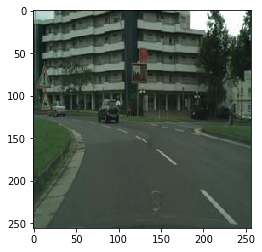

In [663]:
plt.imshow(image)

In [664]:
segmentation = get_one_segmentation(train_seg_list, 0)

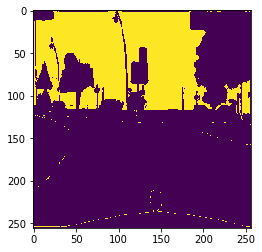

In [666]:
plt.imshow(segmentation[...,1])

In [7]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Conv2D, Conv2DTranspose, MaxPooling2D, BatchNormalization, Input, Activation, concatenate
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam

In [8]:
# Dice коэффициент
def dice_coef(y_true, y_pred):
    return (2.0 * K.sum(y_true * y_pred) + 1.0) / (K.sum(y_true) + K.sum(y_pred) + 1.0)

In [31]:
# Для начала, что-нибудь простенькое - чтобы понять вообще - это все работает или нет...
model = Sequential()
model.add(Input(shape=(256, 256, 3)))

model.add(Conv2D(64, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Conv2D(64, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(MaxPooling2D())

model.add(Conv2D(32, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Conv2D(32, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Conv2D(64, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Conv2D(18, (3, 3), activation='softmax', padding='same'))

model.compile(optimizer='adam',
             loss='categorical_crossentropy',
             metrics=[dice_coef])

In [32]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_18 (Conv2D)           (None, 256, 256, 64)      1792      
_________________________________________________________________
batch_normalization_18 (Batc (None, 256, 256, 64)      256       
_________________________________________________________________
activation_18 (Activation)   (None, 256, 256, 64)      0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 256, 256, 64)      36928     
_________________________________________________________________
batch_normalization_19 (Batc (None, 256, 256, 64)      256       
_________________________________________________________________
activation_19 (Activation)   (None, 256, 256, 64)      0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 128, 128, 64)     

In [11]:
batch_size = 32

In [12]:
hh = model.fit(generate_data(base_dir + 'train/', batch_size=batch_size), epochs=2, 
          validation_data=generate_data(base_dir + 'val/', batch_size=batch_size), verbose=1, 
          steps_per_epoch=len(train_image_list) // batch_size)

Epoch 1/2
92/92 [==============================] - ETA: 23:01 - loss: 3.2563 - dice_coef: 0.04 - ETA: 21:49 - loss: 3.1298 - dice_coef: 0.05 - ETA: 21:41 - loss: 3.0096 - dice_coef: 0.06 - ETA: 21:18 - loss: 2.9189 - dice_coef: 0.07 - ETA: 20:55 - loss: 2.8393 - dice_coef: 0.08 - ETA: 20:45 - loss: 2.7728 - dice_coef: 0.09 - ETA: 20:31 - loss: 2.7138 - dice_coef: 0.10 - ETA: 20:16 - loss: 2.6611 - dice_coef: 0.11 - ETA: 19:59 - loss: 2.6136 - dice_coef: 0.12 - ETA: 19:45 - loss: 2.5701 - dice_coef: 0.13 - ETA: 19:27 - loss: 2.5306 - dice_coef: 0.14 - ETA: 19:10 - loss: 2.4943 - dice_coef: 0.15 - ETA: 18:55 - loss: 2.4608 - dice_coef: 0.15 - ETA: 18:38 - loss: 2.4300 - dice_coef: 0.16 - ETA: 18:23 - loss: 2.4011 - dice_coef: 0.17 - ETA: 18:08 - loss: 2.3738 - dice_coef: 0.17 - ETA: 17:53 - loss: 2.3483 - dice_coef: 0.18 - ETA: 17:40 - loss: 2.3243 - dice_coef: 0.19 - ETA: 17:27 - loss: 2.3020 - dice_coef: 0.19 - ETA: 17:11 - loss: 2.2810 - dice_coef: 0.20 - ETA: 16:58 - loss: 2.2611 - d

KeyboardInterrupt: 

In [13]:
# Ну - я не смог дождаться окончания первой эпохи.... 
# Попробую ограничить количество примеров.

In [23]:
import random
def generate_data(directory, batch_size, data_size=-1):
    i = 0
    image_dir = directory + 'images/'
    seg_dir = directory + 'segmentation/'
    image_list = os.listdir(image_dir)[slice(data_size if data_size > -1 else len(os.listdir(image_dir)))]
    seg_list = os.listdir(seg_dir)[slice(data_size if data_size > -1 else len(os.listdir(image_dir)))]
    indices = list(range(len(image_list)))
    
    while True:
        image_batch = []
        seg_batch = []
        for b in range(batch_size):
            if i == len(image_list):
                i = 0
                random.shuffle(indices)
            
            image_path = image_dir + image_list[indices[i]]
            seg_path = seg_dir + seg_list[indices[i]]
            
            image_batch.append(to_norm_array(Image.open(image_path)))
            seg_batch.append(to_ohe(Image.open(seg_path)))
            
            i += 1

        yield (np.array(image_batch), np.array(seg_batch))

In [33]:
data_size = 2048
val_size = 128

In [34]:
hh = model.fit(generate_data(base_dir + 'train/', batch_size=batch_size, data_size=data_size), epochs=10, 
          validation_data=generate_data(base_dir + 'val/', batch_size=batch_size, data_size=val_size), verbose=1, 
          steps_per_epoch=data_size // batch_size, validation_steps=val_size // batch_size)

Epoch 1/10
64/64 [==============================] - ETA: 16:28 - loss: 3.2924 - dice_coef: 0.04 - ETA: 15:26 - loss: 3.1603 - dice_coef: 0.05 - ETA: 15:15 - loss: 3.0428 - dice_coef: 0.06 - ETA: 15:00 - loss: 2.9497 - dice_coef: 0.07 - ETA: 14:48 - loss: 2.8680 - dice_coef: 0.08 - ETA: 14:31 - loss: 2.7988 - dice_coef: 0.09 - ETA: 14:14 - loss: 2.7384 - dice_coef: 0.10 - ETA: 13:59 - loss: 2.6848 - dice_coef: 0.10 - ETA: 13:43 - loss: 2.6368 - dice_coef: 0.11 - ETA: 13:28 - loss: 2.5930 - dice_coef: 0.12 - ETA: 13:12 - loss: 2.5531 - dice_coef: 0.13 - ETA: 12:57 - loss: 2.5162 - dice_coef: 0.14 - ETA: 12:42 - loss: 2.4822 - dice_coef: 0.14 - ETA: 12:32 - loss: 2.4508 - dice_coef: 0.15 - ETA: 12:19 - loss: 2.4214 - dice_coef: 0.16 - ETA: 12:05 - loss: 2.3936 - dice_coef: 0.16 - ETA: 11:51 - loss: 2.3676 - dice_coef: 0.17 - ETA: 11:35 - loss: 2.3431 - dice_coef: 0.17 - ETA: 11:19 - loss: 2.3202 - dice_coef: 0.18 - ETA: 11:04 - loss: 2.2987 - dice_coef: 0.19 - ETA: 10:49 - loss: 2.2784 - 

64/64 [==============================] - ETA: 15:35 - loss: 0.9552 - dice_coef: 0.56 - ETA: 15:07 - loss: 0.9611 - dice_coef: 0.56 - ETA: 14:52 - loss: 0.9578 - dice_coef: 0.56 - ETA: 14:37 - loss: 0.9715 - dice_coef: 0.56 - ETA: 14:25 - loss: 0.9840 - dice_coef: 0.55 - ETA: 14:13 - loss: 0.9963 - dice_coef: 0.55 - ETA: 13:59 - loss: 1.0090 - dice_coef: 0.55 - ETA: 13:45 - loss: 1.0214 - dice_coef: 0.55 - ETA: 13:29 - loss: 1.0328 - dice_coef: 0.55 - ETA: 13:14 - loss: 1.0420 - dice_coef: 0.54 - ETA: 13:00 - loss: 1.0506 - dice_coef: 0.54 - ETA: 12:46 - loss: 1.0579 - dice_coef: 0.54 - ETA: 12:31 - loss: 1.0644 - dice_coef: 0.54 - ETA: 12:16 - loss: 1.0703 - dice_coef: 0.53 - ETA: 12:02 - loss: 1.0748 - dice_coef: 0.53 - ETA: 11:47 - loss: 1.0784 - dice_coef: 0.53 - ETA: 11:33 - loss: 1.0816 - dice_coef: 0.53 - ETA: 11:18 - loss: 1.0845 - dice_coef: 0.53 - ETA: 11:03 - loss: 1.0873 - dice_coef: 0.53 - ETA: 10:48 - loss: 1.0897 - dice_coef: 0.53 - ETA: 10:33 - loss: 1.0920 - dice_coef: 

64/64 [==============================] - ETA: 15:31 - loss: 0.8966 - dice_coef: 0.58 - ETA: 15:13 - loss: 0.9085 - dice_coef: 0.57 - ETA: 14:56 - loss: 0.9053 - dice_coef: 0.58 - ETA: 14:41 - loss: 0.9167 - dice_coef: 0.58 - ETA: 14:26 - loss: 0.9270 - dice_coef: 0.57 - ETA: 14:12 - loss: 0.9373 - dice_coef: 0.57 - ETA: 13:58 - loss: 0.9488 - dice_coef: 0.57 - ETA: 13:43 - loss: 0.9604 - dice_coef: 0.57 - ETA: 13:29 - loss: 0.9715 - dice_coef: 0.57 - ETA: 13:15 - loss: 0.9807 - dice_coef: 0.56 - ETA: 13:00 - loss: 0.9892 - dice_coef: 0.56 - ETA: 12:45 - loss: 0.9965 - dice_coef: 0.56 - ETA: 12:30 - loss: 1.0030 - dice_coef: 0.56 - ETA: 12:16 - loss: 1.0089 - dice_coef: 0.56 - ETA: 12:01 - loss: 1.0131 - dice_coef: 0.56 - ETA: 11:46 - loss: 1.0165 - dice_coef: 0.55 - ETA: 11:31 - loss: 1.0195 - dice_coef: 0.55 - ETA: 11:17 - loss: 1.0221 - dice_coef: 0.55 - ETA: 11:02 - loss: 1.0247 - dice_coef: 0.55 - ETA: 10:47 - loss: 1.0268 - dice_coef: 0.55 - ETA: 10:33 - loss: 1.0288 - dice_coef: 

In [47]:
# Странный аутпут прогресса получается....
# Но как-то вроде учится.. Страшно долго. Надо пробовать U-Net (Это будет еще более долго :)))

In [60]:
hh.history['val_dice_coef']

[0.1634930670261383,
 0.24123400449752808,
 0.28809407353401184,
 0.32634231448173523,
 0.34802645444869995,
 0.3998701572418213,
 0.4177260398864746,
 0.44115322828292847,
 0.4717254936695099,
 0.5172720551490784]

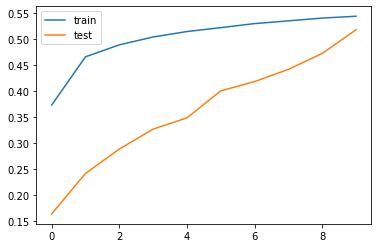

In [45]:
plt.plot(range(10), hh.history['dice_coef'])
plt.plot(range(10), hh.history['val_dice_coef'])
plt.legend(('train', 'test'))

In [67]:
# Ладно - займемся U-Net. Берем пре-тренированную модель

In [1]:
from tensorflow.keras.applications import VGG19

In [2]:
pre_trained_model = VGG19(input_shape=(256, 256, 3), include_top=False, weights="imagenet")

In [12]:
pre_trained_model.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 64, 128)       0     

In [3]:
from tensorflow.keras.utils import plot_model

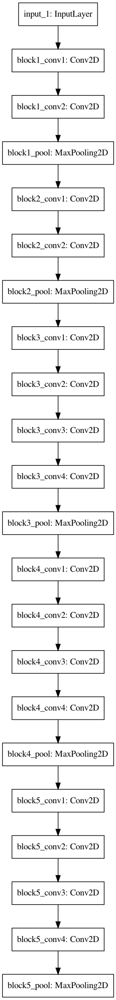

In [4]:
plot_model(pre_trained_model, to_file='vgg19.png')

In [102]:
for i, layer in enumerate(pre_trained_model.layers):
    print('{}: {}'.format(i, layer.name))

0: input_5
1: block1_conv1
2: block1_conv2
3: block1_pool
4: block2_conv1
5: block2_conv2
6: block2_pool
7: block3_conv1
8: block3_conv2
9: block3_conv3
10: block3_conv4
11: block3_pool
12: block4_conv1
13: block4_conv2
14: block4_conv3
15: block4_conv4
16: block4_pool
17: block5_conv1
18: block5_conv2
19: block5_conv3
20: block5_conv4
21: block5_pool


In [ ]:
# Брать результаты из понижающего плеча мы должны со сверточных слоев перед пулингами. Это слои 2, 5, 10, 15, 20..

In [5]:
def pre_trained_unet(shape=(256, 256, 3), num_classes=18):
    pre_trained_model = VGG19(input_shape=shape, include_top=False, weights="imagenet")
    for layer in pre_trained_model.layers:
        layer.trainable = False
    block_out_1 = pre_trained_model.layers[2].output
    block_out_2 = pre_trained_model.layers[5].output
    block_out_3 = pre_trained_model.layers[10].output
    block_out_4 = pre_trained_model.layers[15].output
    block_out_5 = pre_trained_model.layers[20].output
    
    # В самом низу поставим сверточный слой тоже хоть один
    conv_61 = Conv2D(1024, (3, 3), padding='same')(pre_trained_model.layers[-1].output)
    b_61 = BatchNormalization()(conv_61)
    a_61 = Activation('relu')(b_61)
    
    # UP 5
    # Разжимаем самый нижний шаг
    up_5 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(a_61)
    b_51 = BatchNormalization()(up_5)
    a_51 = Activation('relu')(b_51)
    # Объединяем с данными из понижающего плеча
    c_5 = concatenate([a_51, block_out_5])
    
    # Пара сверток
    conv_51 = Conv2D(512, (3, 3), padding='same')(c_5)
    b_52 = BatchNormalization()(conv_51)
    a_52 = Activation('relu')(b_52)

    conv_52 = Conv2D(512, (3, 3), padding='same')(a_52)
    b_53 = BatchNormalization()(conv_52)
    a_53 = Activation('relu')(b_53)
    
    # UP 4
    # Разжимаем на шаг
    up_4 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(a_53)
    b_41 = BatchNormalization()(up_4)
    a_41 = Activation('relu')(b_41)
    # Объединяем с данными из понижающего плеча
    c_4 = concatenate([a_41, block_out_4])
    
    # Пара сверток
    conv_41 = Conv2D(512, (3, 3), padding='same')(c_4)
    b_42 = BatchNormalization()(conv_41)
    a_42 = Activation('relu')(b_42)

    conv_42 = Conv2D(512, (3, 3), padding='same')(a_42)
    b_43 = BatchNormalization()(conv_42)
    a_43 = Activation('relu')(b_43)
    
    # UP 3
    # Разжимаем еще на шаг
    up_3 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(a_43)
    b_31 = BatchNormalization()(up_3)
    a_31 = Activation('relu')(b_31)
    # Объединяем с данными из понижающего плеча
    c_3 = concatenate([a_31, block_out_3])
    
    # Пара сверток
    conv_31 = Conv2D(256, (3, 3), padding='same')(c_3)
    b_32 = BatchNormalization()(conv_31)
    a_32 = Activation('relu')(b_32)

    conv_32 = Conv2D(256, (3, 3), padding='same')(a_32)
    b_33 = BatchNormalization()(conv_32)
    a_33 = Activation('relu')(b_33)
    
    # UP 2
    # Разжимаем еще на шаг
    up_2 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(a_33)
    b_21 = BatchNormalization()(up_2)
    a_21 = Activation('relu')(b_21)
    # Объединяем с данными из понижающего плеча
    c_2 = concatenate([a_21, block_out_2])
    
    # Пара сверток
    conv_21 = Conv2D(128, (3, 3), padding='same')(c_2)
    b_22 = BatchNormalization()(conv_21)
    a_22 = Activation('relu')(b_22)

    conv_22 = Conv2D(128, (3, 3), padding='same')(a_22)
    b_23 = BatchNormalization()(conv_22)
    a_23 = Activation('relu')(b_23)
    
    # UP 1
    # Разжимаем еще на самый верхний уровень
    up_1 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(a_23)
    b_11 = BatchNormalization()(up_1)
    a_11 = Activation('relu')(b_11)
    # Объединяем с данными из понижающего плеча
    c_1 = concatenate([a_11, block_out_1])
    
    # Пара сверток
    conv_11 = Conv2D(64, (3, 3), padding='same')(c_1)
    b_12 = BatchNormalization()(conv_11)
    a_12 = Activation('relu')(b_12)

    conv_12 = Conv2D(64, (3, 3), padding='same')(a_12)
    b_13 = BatchNormalization()(conv_12)
    a_13 = Activation('relu')(b_13)
    
    out = Conv2D(num_classes, (3, 3), activation='softmax', padding='same')(a_13)

    model = Model(pre_trained_model.inputs, out)
    model.compile(optimizer=Adam(),
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])
    
    return model

In [9]:
u_model = pre_trained_unet()

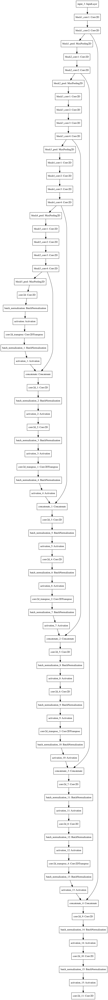

In [10]:
plot_model(u_model, to_file='u_model.png')

In [16]:
u_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 256, 256, 64) 1792        input_2[0][0]                    
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 256, 256, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 128, 128, 64) 0           block1_conv2[0][0]               
______________________________________________________________________________________________

In [115]:
# Ох - боюсь страшно тяжелая она получилась - тренироваться будет вечность....

In [117]:
data_size = 128
val_size = 64

In [118]:
hh = u_model.fit(generate_data(base_dir + 'train/', batch_size=batch_size, data_size=data_size), epochs=2, 
          validation_data=generate_data(base_dir + 'val/', batch_size=batch_size, data_size=val_size), verbose=1, 
          steps_per_epoch=data_size // batch_size, validation_steps=val_size // batch_size)

Epoch 1/2
4/4 [==============================] - ETA: 2:13 - loss: 3.3965 - dice_coef: 0.051 - ETA: 1:23 - loss: 3.2089 - dice_coef: 0.064 - ETA: 41s - loss: 3.0494 - dice_coef: 0.079 - ETA: 0s - loss: 2.9270 - dice_coef: 0.0946 - 200s 52s/step - loss: 2.8536 - dice_coef: 0.1036 - val_loss: 4.4623 - val_dice_coef: 0.0976
Epoch 2/2
4/4 [==============================] - ETA: 2:06 - loss: 1.5642 - dice_coef: 0.350 - ETA: 1:24 - loss: 1.5296 - dice_coef: 0.366 - ETA: 42s - loss: 1.4932 - dice_coef: 0.383 - ETA: 0s - loss: 1.4803 - dice_coef: 0.3948 - 197s 52s/step - loss: 1.4726 - dice_coef: 0.4014 - val_loss: 5.4843 - val_dice_coef: 0.1250


In [119]:
# Вобщем вроде взлетело и как-то учится... 
# На этом этапе я загружу первый коммит по ДЗ.
# И поставлю учиться на полных данных и эпох 5 хотя-бы... если успеет к вебинару - загружу апдейт.

In [27]:
u_model = pre_trained_unet()

In [28]:
data_size = len(train_image_list)
val_size = 256
batch_size = 32

In [29]:
hh = u_model.fit(generate_data(base_dir + 'train/', batch_size=batch_size, data_size=data_size), epochs=8, 
          validation_data=generate_data(base_dir + 'val/', batch_size=batch_size, data_size=val_size), verbose=1, 
          steps_per_epoch=data_size // batch_size, validation_steps=val_size // batch_size)

Epoch 1/8
92/92 [==============================] - ETA: 1:05:27 - loss: 3.3193 - dice_coef: 0.05 - ETA: 1:01:35 - loss: 3.1770 - dice_coef: 0.06 - ETA: 1:00:39 - loss: 3.0453 - dice_coef: 0.07 - ETA: 1:00:01 - loss: 2.9280 - dice_coef: 0.08 - ETA: 59:20 - loss: 2.8268 - dice_coef: 0.1031 - ETA: 58:37 - loss: 2.7393 - dice_coef: 0.11 - ETA: 57:56 - loss: 2.6650 - dice_coef: 0.12 - ETA: 57:17 - loss: 2.5993 - dice_coef: 0.14 - ETA: 56:35 - loss: 2.5388 - dice_coef: 0.15 - ETA: 55:55 - loss: 2.4831 - dice_coef: 0.16 - ETA: 55:13 - loss: 2.4331 - dice_coef: 0.17 - ETA: 54:31 - loss: 2.3866 - dice_coef: 0.18 - ETA: 53:49 - loss: 2.3433 - dice_coef: 0.19 - ETA: 53:08 - loss: 2.3035 - dice_coef: 0.20 - ETA: 52:27 - loss: 2.2658 - dice_coef: 0.21 - ETA: 51:46 - loss: 2.2301 - dice_coef: 0.22 - ETA: 51:06 - loss: 2.1964 - dice_coef: 0.23 - ETA: 50:24 - loss: 2.1646 - dice_coef: 0.24 - ETA: 49:42 - loss: 2.1344 - dice_coef: 0.25 - ETA: 49:02 - loss: 2.1057 - dice_coef: 0.26 - ETA: 48:21 - loss: 

92/92 [==============================] - ETA: 1:02:28 - loss: 0.5716 - dice_coef: 0.73 - ETA: 1:01:08 - loss: 0.5795 - dice_coef: 0.73 - ETA: 1:00:30 - loss: 0.5949 - dice_coef: 0.72 - ETA: 59:52 - loss: 0.6028 - dice_coef: 0.7274 - ETA: 59:12 - loss: 0.6075 - dice_coef: 0.72 - ETA: 58:30 - loss: 0.6102 - dice_coef: 0.72 - ETA: 57:51 - loss: 0.6117 - dice_coef: 0.72 - ETA: 57:12 - loss: 0.6136 - dice_coef: 0.72 - ETA: 56:33 - loss: 0.6151 - dice_coef: 0.72 - ETA: 55:51 - loss: 0.6164 - dice_coef: 0.72 - ETA: 55:10 - loss: 0.6173 - dice_coef: 0.72 - ETA: 54:29 - loss: 0.6181 - dice_coef: 0.72 - ETA: 53:48 - loss: 0.6189 - dice_coef: 0.72 - ETA: 53:07 - loss: 0.6194 - dice_coef: 0.72 - ETA: 52:26 - loss: 0.6198 - dice_coef: 0.72 - ETA: 51:47 - loss: 0.6203 - dice_coef: 0.72 - ETA: 51:06 - loss: 0.6207 - dice_coef: 0.72 - ETA: 50:26 - loss: 0.6212 - dice_coef: 0.72 - ETA: 49:44 - loss: 0.6216 - dice_coef: 0.72 - ETA: 49:02 - loss: 0.6220 - dice_coef: 0.72 - ETA: 48:21 - loss: 0.6224 - dic

92/92 [==============================] - ETA: 1:01:25 - loss: 0.5799 - dice_coef: 0.73 - ETA: 1:00:46 - loss: 0.5843 - dice_coef: 0.73 - ETA: 1:00:06 - loss: 0.5907 - dice_coef: 0.73 - ETA: 59:21 - loss: 0.5907 - dice_coef: 0.7318 - ETA: 58:48 - loss: 0.5918 - dice_coef: 0.73 - ETA: 58:08 - loss: 0.5913 - dice_coef: 0.73 - ETA: 57:25 - loss: 0.5894 - dice_coef: 0.73 - ETA: 56:43 - loss: 0.5880 - dice_coef: 0.73 - ETA: 56:05 - loss: 0.5867 - dice_coef: 0.73 - ETA: 55:24 - loss: 0.5854 - dice_coef: 0.73 - ETA: 54:43 - loss: 0.5843 - dice_coef: 0.73 - ETA: 54:02 - loss: 0.5833 - dice_coef: 0.73 - ETA: 53:20 - loss: 0.5826 - dice_coef: 0.73 - ETA: 52:39 - loss: 0.5823 - dice_coef: 0.73 - ETA: 51:59 - loss: 0.5823 - dice_coef: 0.73 - ETA: 51:27 - loss: 0.5820 - dice_coef: 0.73 - ETA: 50:50 - loss: 0.5817 - dice_coef: 0.73 - ETA: 50:10 - loss: 0.5815 - dice_coef: 0.73 - ETA: 49:30 - loss: 0.5811 - dice_coef: 0.73 - ETA: 48:50 - loss: 0.5809 - dice_coef: 0.73 - ETA: 48:09 - loss: 0.5807 - dic

92/92 [==============================] - ETA: 1:02:10 - loss: 0.5973 - dice_coef: 0.73 - ETA: 1:02:21 - loss: 0.5942 - dice_coef: 0.74 - ETA: 1:01:59 - loss: 0.5858 - dice_coef: 0.74 - ETA: 1:01:02 - loss: 0.5781 - dice_coef: 0.74 - ETA: 1:00:47 - loss: 0.5731 - dice_coef: 0.74 - ETA: 1:00:32 - loss: 0.5690 - dice_coef: 0.74 - ETA: 1:00:09 - loss: 0.5670 - dice_coef: 0.74 - ETA: 59:14 - loss: 0.5668 - dice_coef: 0.7481 - ETA: 58:24 - loss: 0.5665 - dice_coef: 0.74 - ETA: 57:37 - loss: 0.5651 - dice_coef: 0.74 - ETA: 57:03 - loss: 0.5636 - dice_coef: 0.74 - ETA: 56:25 - loss: 0.5619 - dice_coef: 0.74 - ETA: 55:40 - loss: 0.5602 - dice_coef: 0.74 - ETA: 54:58 - loss: 0.5590 - dice_coef: 0.74 - ETA: 54:15 - loss: 0.5576 - dice_coef: 0.75 - ETA: 53:31 - loss: 0.5564 - dice_coef: 0.75 - ETA: 52:46 - loss: 0.5550 - dice_coef: 0.75 - ETA: 52:01 - loss: 0.5538 - dice_coef: 0.75 - ETA: 51:16 - loss: 0.5529 - dice_coef: 0.75 - ETA: 50:32 - loss: 0.5522 - dice_coef: 0.75 - ETA: 49:48 - loss: 0.55

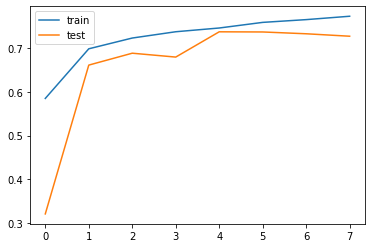

In [30]:
plt.plot(range(8), hh.history['dice_coef'])
plt.plot(range(8), hh.history['val_dice_coef'])
plt.legend(('train', 'test'))

In [32]:
# Не слишком здорово. Но что-то есть.. в районе 4-5 эпох было лучше всего...

In [202]:
image = get_one_image(test_image_list, 1)
segm = get_one_segmentation(test_seg_list, 1)

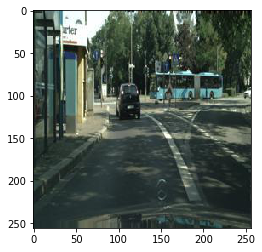

In [203]:
plt.imshow(image)

In [204]:
y_pred = u_model.predict(np.array((image, )))

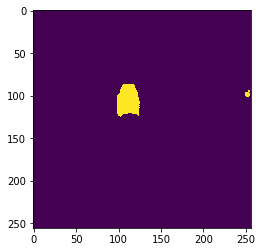

In [205]:
# Исходная разметка
plt.imshow(segm[...,6])

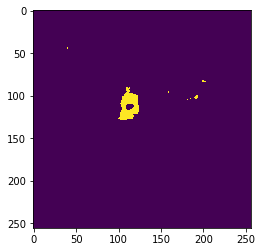

In [206]:
# Предсказанная разметка
plt.imshow(np.argmax(y_pred[0], axis=2)==6)

In [ ]:
# Интересная история - какие-то классы предсказывает хоть как-то. А какие-то вообще никак..

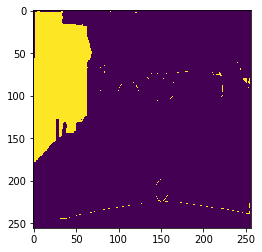

In [207]:
# Исходная разметка
plt.imshow(segm[...,1])

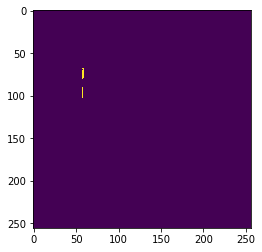

In [208]:
# Предсказанная разметка
plt.imshow(np.argmax(y_pred[0], axis=2)==1)

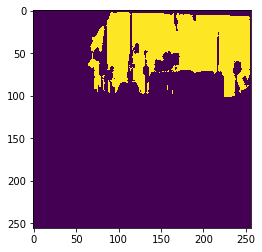

In [210]:
# Деревья попали везде...
# Исходная разметка
plt.imshow(segm[...,2])

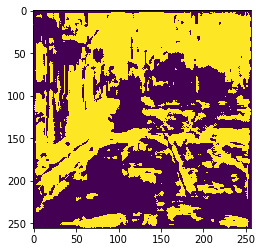

In [211]:
# Предсказанная разметка
plt.imshow(np.argmax(y_pred[0], axis=2)==2)

In [212]:
# А дороги вообще нет никакой... Ни на одном из примеров он этот класс не предсказывает

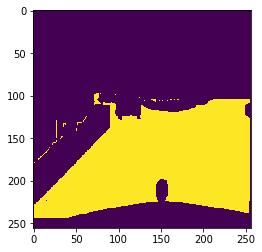

In [213]:
# Исходная разметка
plt.imshow(segm[...,3])

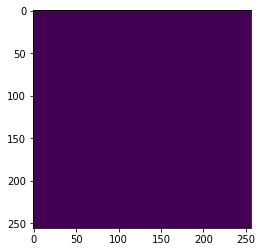

In [214]:
# Предсказанная разметка
plt.imshow(np.argmax(y_pred[0], axis=2)==3)

In [227]:
# С "высоты" моего опыта - не могу никак объяснить такое поведение...